# **Домашнее задание №1 (base)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

**Максимальная оценка за дз**
> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [159]:
pip install ydata-profiling

In [160]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import re
from ydata_profiling import ProfileReport

random.seed(42)
np.random.seed(42)

**Задание 0 (0 баллов).**
Для чего фиксируем сиды в домашках?

`Your answer here`для одинаковых результатов

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [161]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.55 балла)**

Выполните операции, направленные на практику основных действий с `pandas`:
- [ ] Отобразите 10 случайных строк тренировочного датасета (0.15 балла)
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)


**Бонус**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)

In [162]:
# Отобразите 10 случайных строк тренировочного датасета (0.15 балла)
df_test.sample(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
521,Tata Tigor 1.2 Revotron XT,2018,450000,35000,Petrol,Individual,Manual,First Owner,20.3 kmpl,1199 CC,84 bhp,114Nm@ 3500rpm,5.0
737,Mahindra NuvoSport N8 AMT,2016,650000,50000,Diesel,Individual,Automatic,First Owner,17.45 kmpl,1493 CC,100 bhp,240Nm@ 1600-2800rpm,7.0
740,Toyota Innova 2.5 GX 7 STR,2012,520000,162000,Diesel,Individual,Manual,Fourth & Above Owner,12.8 kmpl,2494 CC,102 bhp,20.4@ 1400-3400(kgm@ rpm),7.0
660,Hyundai Sonata 2.0L CRDi MT,2009,330000,180000,Diesel,Individual,Manual,First Owner,13.6 kmpl,1991 CC,142 bhp,"33@ 2,000-2,680(kgm@ rpm)",5.0
411,Hyundai i20 1.4 CRDi Era,2010,350000,90000,Diesel,Individual,Manual,Second Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
678,Maruti Vitara Brezza ZDi Plus,2019,900000,40000,Diesel,Individual,Manual,First Owner,24.3 kmpl,1248 CC,88.5 bhp,200Nm@ 1750rpm,5.0
626,Maruti 800 AC,2006,50000,40000,Petrol,Individual,Manual,Third Owner,16.1 kmpl,796 CC,37 bhp,59Nm@ 2500rpm,4.0
513,Hyundai Grand i10 Magna,2016,400000,80000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,1197 CC,82 bhp,114Nm@ 4000rpm,5.0
859,Maruti Wagon R VXI BS IV with ABS,2010,215000,120600,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
136,Mahindra Verito 1.5 D2 BSIV,2012,140000,120000,Diesel,Individual,Manual,Second Owner,21.03 kmpl,1461 CC,65 bhp,160Nm@ 2000rpm,5.0


In [163]:
# Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [164]:
df_test.tail()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [165]:
# Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
df_test.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,19
engine,19


In [166]:
df_train.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,202
engine,202


In [167]:
# Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
df_test.duplicated().sum()

62

In [168]:
df_train.duplicated().sum()

985

In [169]:
#  Постройте дашборд, используя ydata-profilling(0.15 балла)
profile_test = ProfileReport(df_test, title="Cars test")

profile_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [170]:
profile_train = ProfileReport(df_train, title="Cars train")

profile_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [171]:
profile_t = ProfileReport(df_test, title="Cars test")
profile_t.to_file("cars_test.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [172]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Мы обнаружили пропуски. Давайте избавимся от них.

- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [173]:
# Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        981 non-null    object 
 9   engine         981 non-null    object 
 10  max_power      981 non-null    object 
 11  torque         981 non-null    object 
 12  seats          981 non-null    float64
dtypes: float64(1), int64(3), object(9)
memory usage: 101.7+ KB


In [174]:
df_test['mileage'] = df_test['mileage'].str.replace(r'[^0-9.]', '', regex=True)
df_test['mileage'] = df_test['mileage'].astype(float)

In [175]:
df_test['engine'] = df_test['engine'].str.replace(r'[^0-9.]', '', regex=True)
df_test['engine'] = df_test['engine'].astype(float)

In [176]:
df_test['max_power'] = df_test['max_power'].str.replace(r'[^0-9.]', '', regex=True)
df_test['max_power'] = df_test['max_power'].astype(float)

In [177]:
df_test['torque'] = df_test['torque'].str.replace(r'[^0-9.]', '', regex=True)
df_test['torque'] = df_test['torque'].astype(float)

In [178]:
df_train['mileage'] = df_train['mileage'].str.replace(r'[^0-9.]', '', regex=True)
df_train['mileage'] = df_train['mileage'].astype(float)

In [179]:
  df_train['engine'] = df_train['engine'].str.replace(r'[^0-9.]', '', regex=True)
  df_train['engine'] = df_train['engine'].astype(float)

In [180]:
df_train['torque'] = df_train['torque'].str.replace(r'[^0-9.]', '', regex=True)
df_train['torque'] = df_train['torque'].astype(float)

In [181]:
df_train['max_power'] = df_train['max_power'].str.replace(r'[^0-9.]', '', regex=True)
df_train['max_power'] = df_train['max_power'].replace('', None)
df_train['max_power'] = df_train['max_power'].astype(float)

In [182]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   float64
 9   engine         6797 non-null   float64
 10  max_power      6802 non-null   float64
 11  torque         6796 non-null   float64
 12  seats          6797 non-null   float64
dtypes: float64(5), int64(3), object(5)
memory usage: 711.0+ KB


In [183]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        981 non-null    float64
 9   engine         981 non-null    float64
 10  max_power      981 non-null    float64
 11  torque         981 non-null    float64
 12  seats          981 non-null    float64
dtypes: float64(5), int64(3), object(5)
memory usage: 101.7+ KB


In [184]:
test_mileage = df_test['mileage'].median()
df_test['mileage'].fillna(test_mileage, inplace=True)

<ipython-input-184-16adc42a636b>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['mileage'].fillna(test_mileage, inplace=True)


In [185]:
test_engine = df_test['engine'].median()
df_test['engine'].fillna(test_engine, inplace=True)

<ipython-input-185-75fec2fb1310>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['engine'].fillna(test_engine, inplace=True)


In [186]:
test_max_power = df_test['max_power'].median()
df_test['max_power'].fillna(test_max_power, inplace=True)

<ipython-input-186-5a832e76775e>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['max_power'].fillna(test_max_power, inplace=True)


In [187]:
test_torque = df_test['torque'].median()
df_test['torque'].fillna(test_torque, inplace=True)

<ipython-input-187-2310bee92055>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['torque'].fillna(test_torque, inplace=True)


In [188]:
test_seats = df_test['seats'].median()
df_test['seats'].fillna(test_seats, inplace=True)

<ipython-input-188-af552f561422>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_test['seats'].fillna(test_seats, inplace=True)


In [189]:
train_mileage = df_train['mileage'].median()
df_train['mileage'].fillna(train_mileage, inplace=True)

<ipython-input-189-6c9454866c25>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_train['mileage'].fillna(train_mileage, inplace=True)


In [190]:
train_engine = df_train['engine'].median()
df_train['engine'].fillna(train_engine, inplace=True)

<ipython-input-190-eef7c3b3974a>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_train['engine'].fillna(train_engine, inplace=True)


In [191]:
train_max_power = df_train['max_power'].median()
df_train['max_power'].fillna(train_max_power, inplace=True)

<ipython-input-191-be23577e087b>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_train['max_power'].fillna(train_max_power, inplace=True)


In [192]:
train_torque = df_train['torque'].median()
df_train['torque'].fillna(train_torque, inplace=True)

<ipython-input-192-c5e9536c1acf>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_train['torque'].fillna(train_torque, inplace=True)


In [193]:
train_seats = df_train['seats'].median()
df_train['seats'].fillna(train_seats, inplace=True)

<ipython-input-193-fa4ce86bbff4>:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_train['seats'].fillna(train_seats, inplace=True)


In [194]:
median_values = {}
for col in ['mileage', 'engine', 'max_power', 'seats']:
    median_value = df_train[col].median()
    median_values[col] = median_value
    df_train[col] = df_train[col].fillna(df_train[col].median())
    df_test[col] = df_test[col].fillna(df_train[col].median())

In [195]:
with open('median_score.pkl', 'wb') as file:
    pickle.dump(median_values, file)

In [196]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        1000 non-null   float64
 9   engine         1000 non-null   float64
 10  max_power      1000 non-null   float64
 11  torque         1000 non-null   float64
 12  seats          1000 non-null   float64
dtypes: float64(5), int64(3), object(5)
memory usage: 101.7+ KB


In [197]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6999 non-null   float64
 9   engine         6999 non-null   float64
 10  max_power      6999 non-null   float64
 11  torque         6999 non-null   float64
 12  seats          6999 non-null   float64
dtypes: float64(5), int64(3), object(5)
memory usage: 711.0+ KB


### **Задание 2 (0.5 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [198]:
# Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,1.902000e+06,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,2.501500e+10,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,2.241750e+01,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,1.154500e+01,5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,1.137540e+02,5.0


In [199]:
# обозначим переменную дублей и дропним их
dup = df_train.drop(columns='selling_price', axis=1)
print(dup)
df_train = df_train.drop_duplicates(subset=dup.columns, keep='first')

                               name  year  km_driven    fuel seller_type  \
0            Maruti Swift Dzire VDI  2014     145500  Diesel  Individual   
1      Skoda Rapid 1.5 TDI Ambition  2014     120000  Diesel  Individual   
2         Hyundai i20 Sportz Diesel  2010     127000  Diesel  Individual   
3            Maruti Swift VXI BSIII  2007     120000  Petrol  Individual   
4     Hyundai Xcent 1.2 VTVT E Plus  2017      45000  Petrol  Individual   
...                             ...   ...        ...     ...         ...   
6994              Hyundai i20 Magna  2013     110000  Petrol  Individual   
6995          Hyundai Verna CRDi SX  2007     119000  Diesel  Individual   
6996         Maruti Swift Dzire ZDi  2009     120000  Diesel  Individual   
6997                Tata Indigo CR4  2013      25000  Diesel  Individual   
6998                Tata Indigo CR4  2013      25000  Diesel  Individual   

     transmission                 owner  mileage  engine  max_power  \
0          Manua

In [200]:
# сохраним индекс
df_train.reset_index(drop=True, inplace=True)

In [201]:
# запишем размерность
df_train.shape

(5840, 13)

In [202]:
assert df_train.shape == (5840, 13)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

In [203]:
# Уберите единицы измерения для признаков mileage, engine, max_power.
print(f'Заметим, что убирали ранее единиц измерения для того, чтобы заполнять пропуски в пункте №1 и для train & test')
print('-'*110)
print(df_test.info(), df_train.info())

#  Приведите тип данных к float.
print(f'Заменил ранее тип данных на:', 'train', df_train['mileage'].dtypes, 'test', df_test['mileage'].dtypes)
print(f'Заменил ранее тип данных на:', 'train', df_train['engine'].dtypes, 'test', df_test['engine'].dtypes)
print(f'Заменил ранее тип данных на:', 'train', df_train['max_power'].dtypes, 'test', df_test['max_power'].dtypes)
print(f'Заменил ранее тип данных на:', 'train', df_train['torque'].dtypes, 'test', df_test['torque'].dtypes)

Заметим, что убирали ранее единиц измерения для того, чтобы заполнять пропуски в пункте №1 и для train & test
--------------------------------------------------------------------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        1000 non-null   float64
 9   engine         1000 non-null   float64
 10  max_power      1000 non-null   float64
 11  torque         1000 non-null   float64
 12  seats          1000 non-null   float64
dtypes: float

In [204]:
# Стобец torque мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.
df_test.drop('torque', axis=1, inplace=True)
df_train.drop('torque', axis=1, inplace=True)

<ipython-input-204-e37f0227de7a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train.drop('torque', axis=1, inplace=True)


In [205]:
df_test.head(3)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0,2498.0,112.0,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5,1497.0,108.5,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9,1799.0,130.0,5.0


In [206]:
df_train.head(3)


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,5.0


### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [207]:
# Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы engnine и seats к приведем к int.
print(f'приведем необходимые столбцы engine & seats к int')
df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)
df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)


приведем необходимые столбцы engine & seats к int


<ipython-input-207-b0aa33a6847c>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['engine'] = df_train['engine'].astype(int)
<ipython-input-207-b0aa33a6847c>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['seats'] = df_train['seats'].astype(int)


In [208]:
df_test.info(), df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        1000 non-null   float64
 9   engine         1000 non-null   int64  
 10  max_power      1000 non-null   float64
 11  seats          1000 non-null   int64  
dtypes: float64(2), int64(5), object(5)
memory usage: 93.9+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5840 entries, 0 to 5839
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           

(None, None)

### **Задание 5 (0.1 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [209]:
# your code here
df_test.describe(), df_test.describe(include = 'object')

(              year  selling_price      km_driven      mileage      engine  \
 count  1000.000000   1.000000e+03    1000.000000  1000.000000  1000.00000   
 mean   2013.681000   6.179010e+05   71393.341000    19.338050  1454.87600   
 std       4.012149   7.585539e+05   48486.218662     3.951748   521.99574   
 min    1995.000000   3.100000e+04    1303.000000     0.000000   624.00000   
 25%    2011.000000   2.500000e+05   37000.000000    16.550000  1197.00000   
 50%    2014.000000   4.349990e+05   61500.000000    19.330000  1248.00000   
 75%    2017.000000   6.700000e+05  100000.000000    22.300000  1582.00000   
 max    2020.000000   6.000000e+06  375000.000000    32.260000  3604.00000   
 
          max_power        seats  
 count  1000.000000  1000.000000  
 mean     90.865230     5.403000  
 std      34.887729     0.912921  
 min      34.200000     4.000000  
 25%      69.000000     5.000000  
 50%      83.100000     5.000000  
 75%     102.000000     5.000000  
 max     280.000

In [210]:
df_train.describe(), df_train.describe(include = 'object')

(              year  selling_price     km_driven      mileage       engine  \
 count  5840.000000   5.840000e+03  5.840000e+03  5840.000000  5840.000000   
 mean   2013.428425   5.229601e+05  7.395224e+04    19.428611  1429.448973   
 std       4.095622   5.354320e+05  6.007114e+04     3.986026   485.662834   
 min    1983.000000   2.999900e+04  1.000000e+00     0.000000   624.000000   
 25%    2011.000000   2.500000e+05  3.900000e+04    16.950000  1197.000000   
 50%    2014.000000   4.050000e+05  7.000000e+04    19.300000  1248.000000   
 75%    2017.000000   6.400000e+05  1.000000e+05    22.300000  1498.000000   
 max    2020.000000   1.000000e+07  2.360457e+06    42.000000  3604.000000   
 
          max_power        seats  
 count  5840.000000  5840.000000  
 mean     87.910782     5.426712  
 std      31.639585     0.982344  
 min       0.000000     2.000000  
 25%      68.000000     5.000000  
 50%      81.860000     5.000000  
 75%      99.000000     5.000000  
 max     400.000

In [211]:
df_train.shape

(5840, 12)

In [212]:
assert df_train.shape == (5840, 12)

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

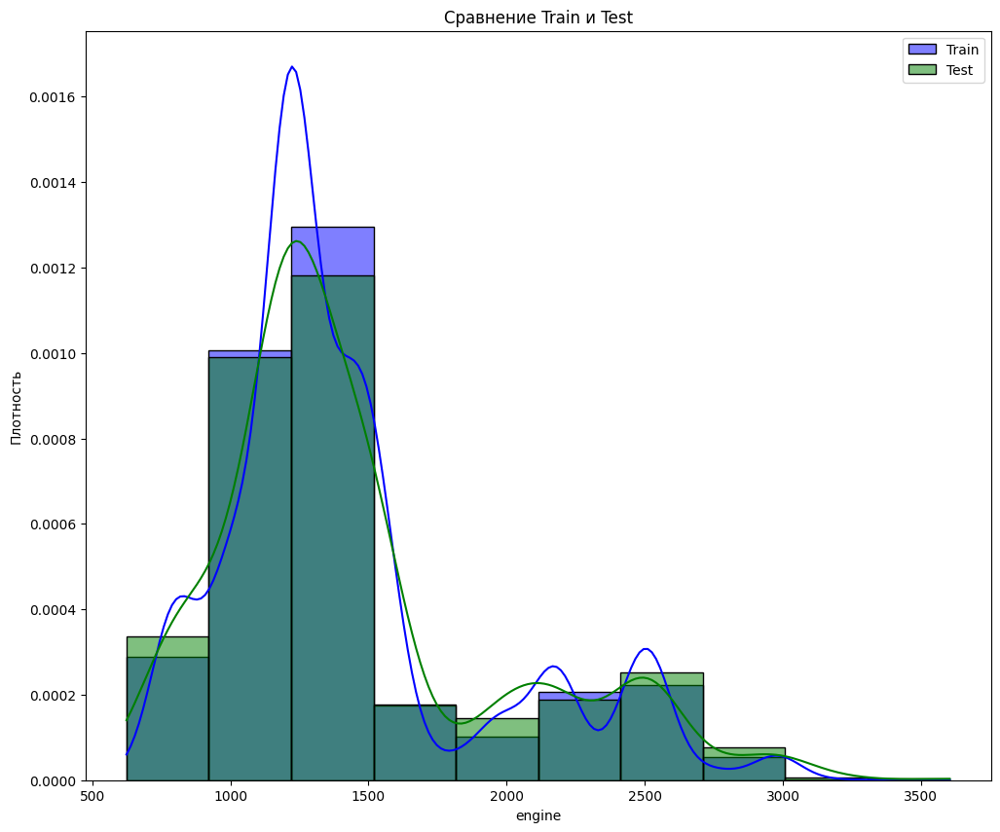

In [213]:
# your code here
plt.figure(figsize=(12, 10))
sns.histplot(df_train['engine'], bins=10, color='blue', label='Train', kde=True, stat='density')
sns.histplot(df_test['engine'], bins=10, color='green', label='Test', kde=True, stat='density')
plt.title('Сравнение Train и Test')
plt.xlabel('engine')
plt.ylabel('Плотность')
plt.legend()
plt.show()

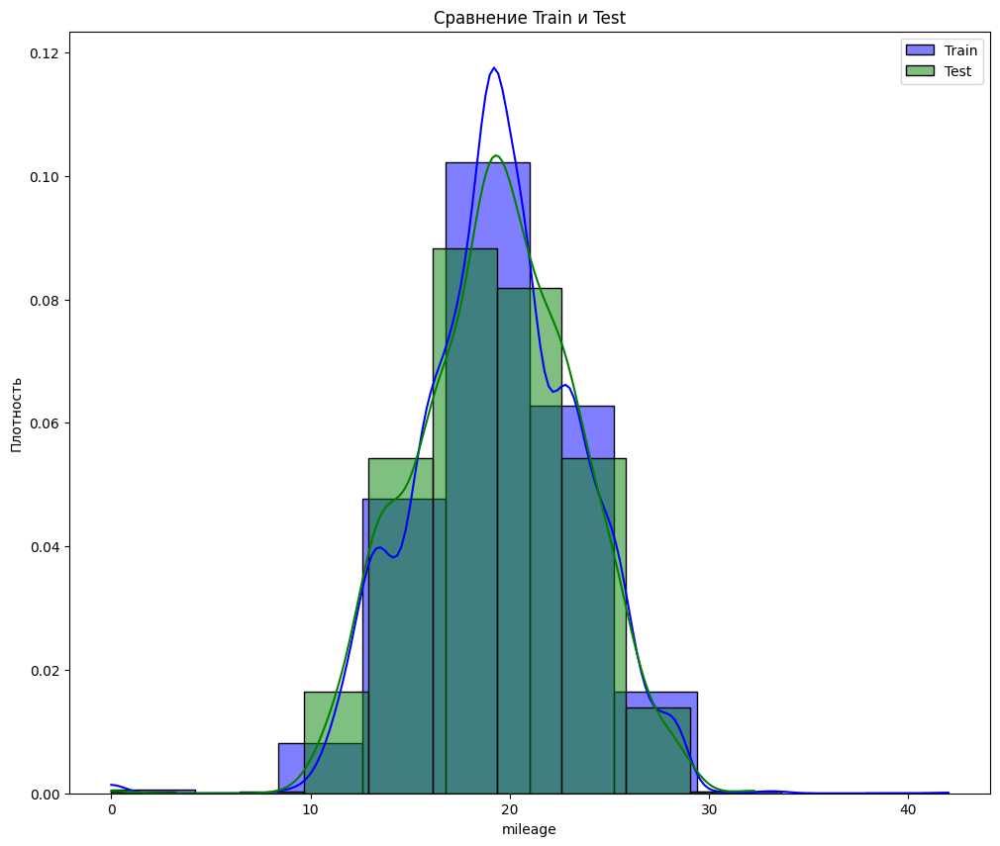

In [214]:
plt.figure(figsize=(12, 10))
sns.histplot(df_train['mileage'], bins=10, color='blue', label='Train', kde=True, stat='density')
sns.histplot(df_test['mileage'], bins=10, color='green', label='Test', kde=True, stat='density')
plt.title('Сравнение Train и Test')
plt.xlabel('mileage')
plt.ylabel('Плотность')
plt.legend()
plt.show()

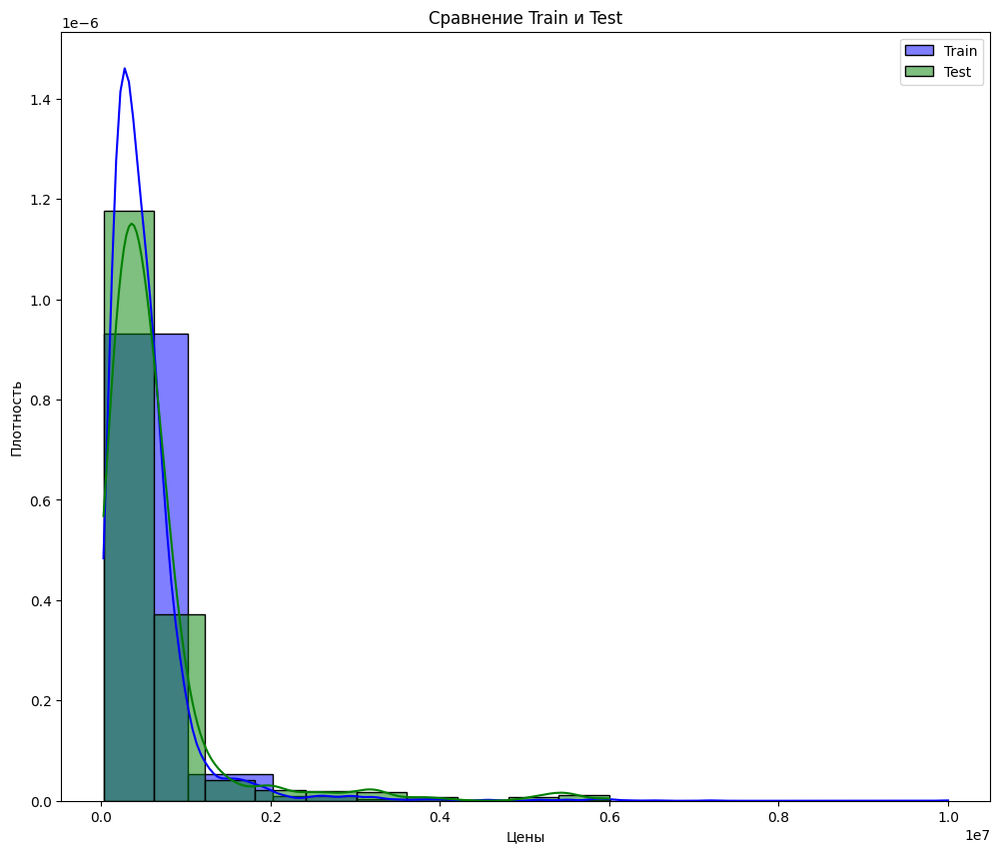

In [215]:
plt.figure(figsize=(12, 10))
sns.histplot(df_train['selling_price'], bins=10, color='blue', label='Train', kde=True, stat='density')
sns.histplot(df_test['selling_price'], bins=10, color='green', label='Test', kde=True, stat='density')
plt.title('Сравнение Train и Test')
plt.xlabel('Цены')
plt.ylabel('Плотность')
plt.legend()
plt.show()

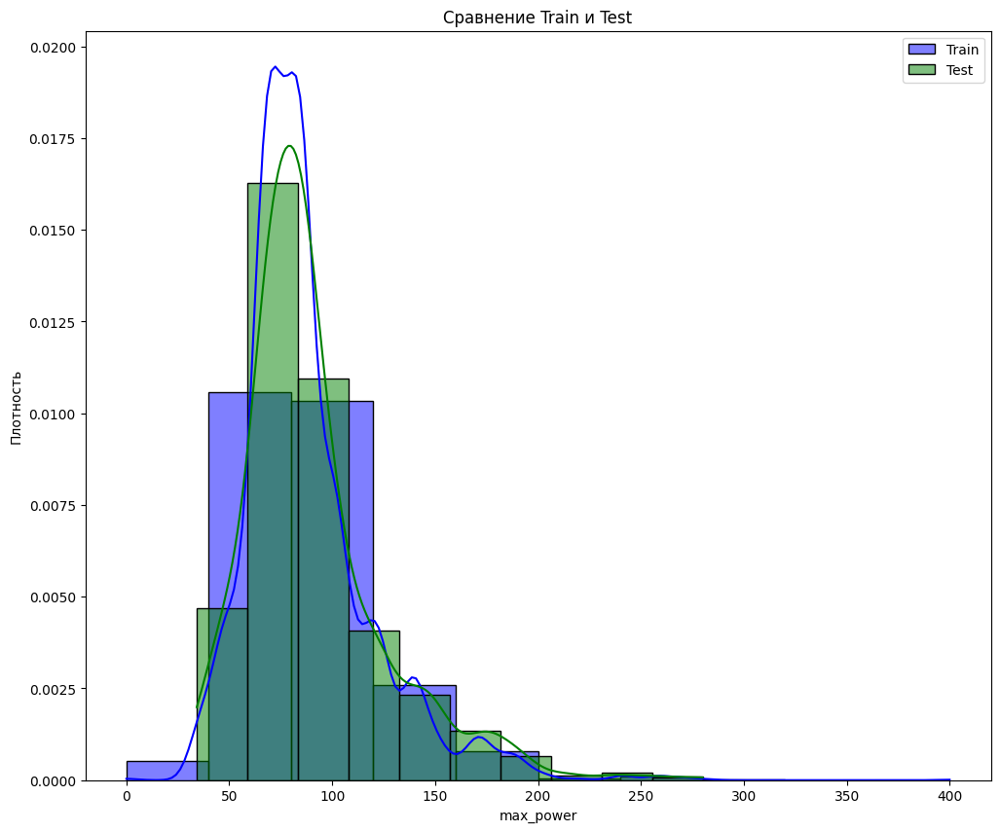

In [216]:
plt.figure(figsize=(12, 10))
sns.histplot(df_train['max_power'], bins=10, color='blue', label='Train', kde=True, stat='density')
sns.histplot(df_test['max_power'], bins=10, color='green', label='Test', kde=True, stat='density')
plt.title('Сравнение Train и Test')
plt.xlabel('max_power')
plt.ylabel('Плотность')
plt.legend()
plt.show()

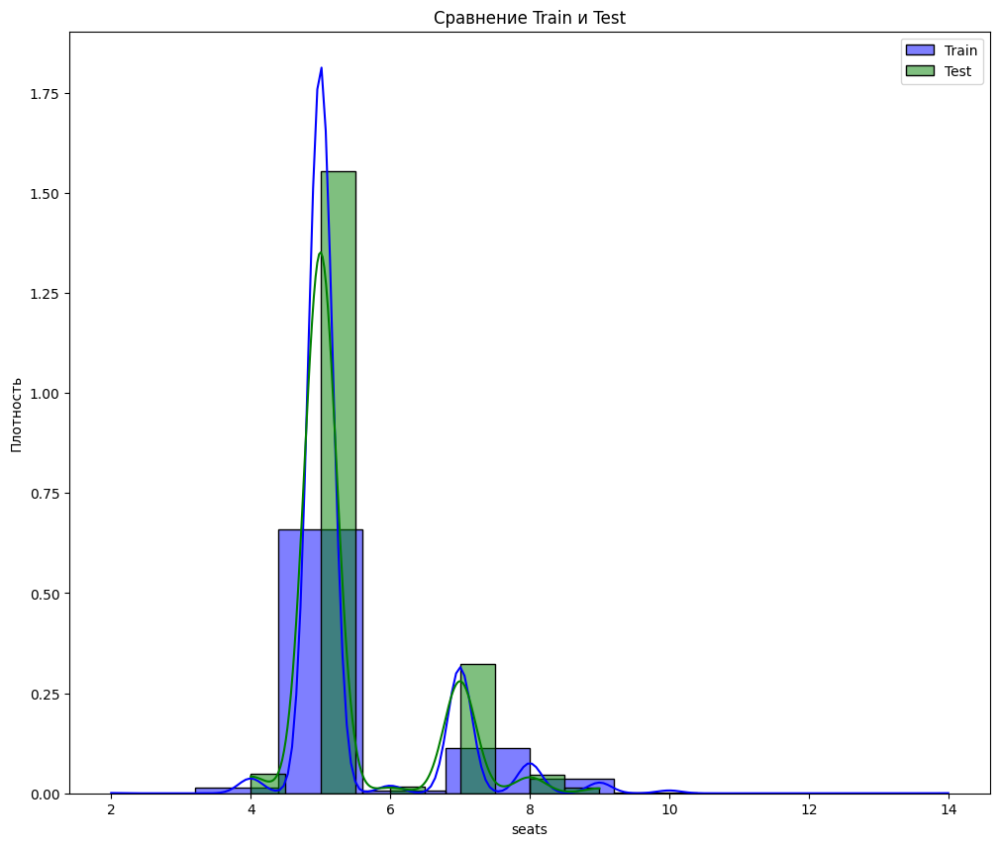

In [217]:
plt.figure(figsize=(12, 10))
sns.histplot(df_train['seats'], bins=10, color='blue', label='Train', kde=True, stat='density')
sns.histplot(df_test['seats'], bins=10, color='green', label='Test', kde=True, stat='density')
plt.title('Сравнение Train и Test')
plt.xlabel('seats')
plt.ylabel('Плотность')
plt.legend()
plt.show()

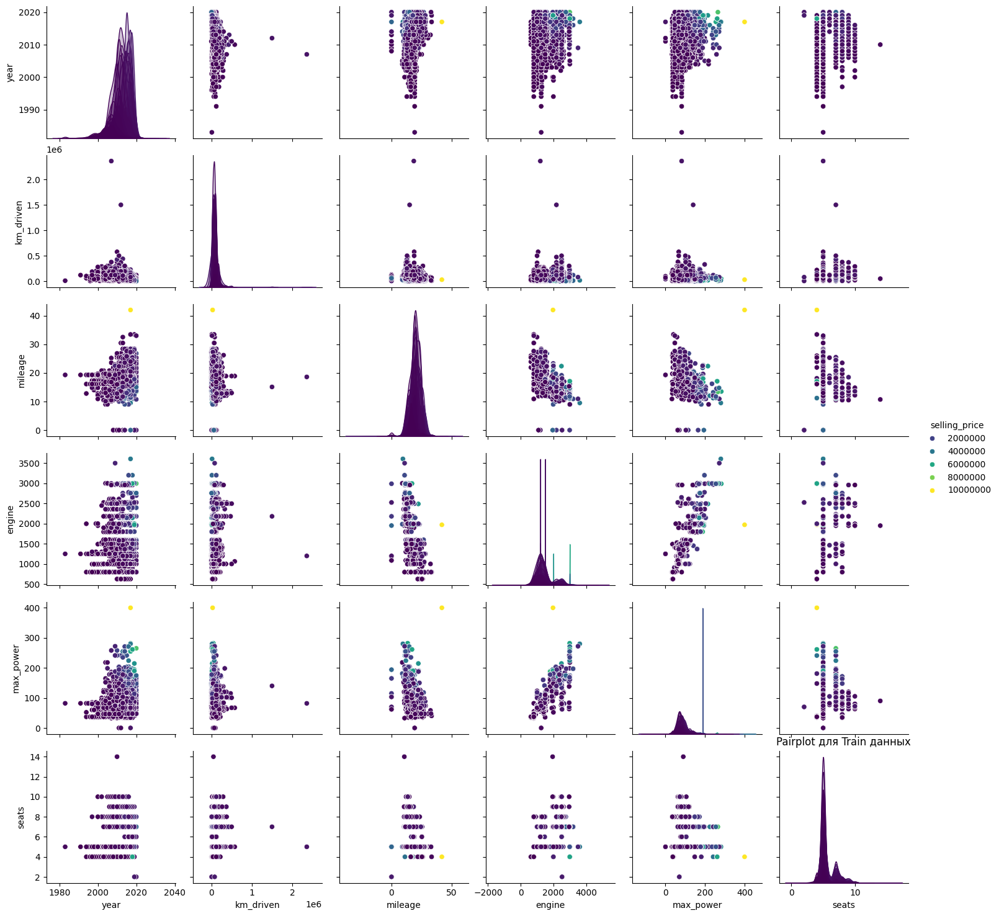

In [218]:
sns.pairplot(df_train, hue='selling_price', palette='viridis')
plt.title('Pairplot для Train данных')
plt.show()

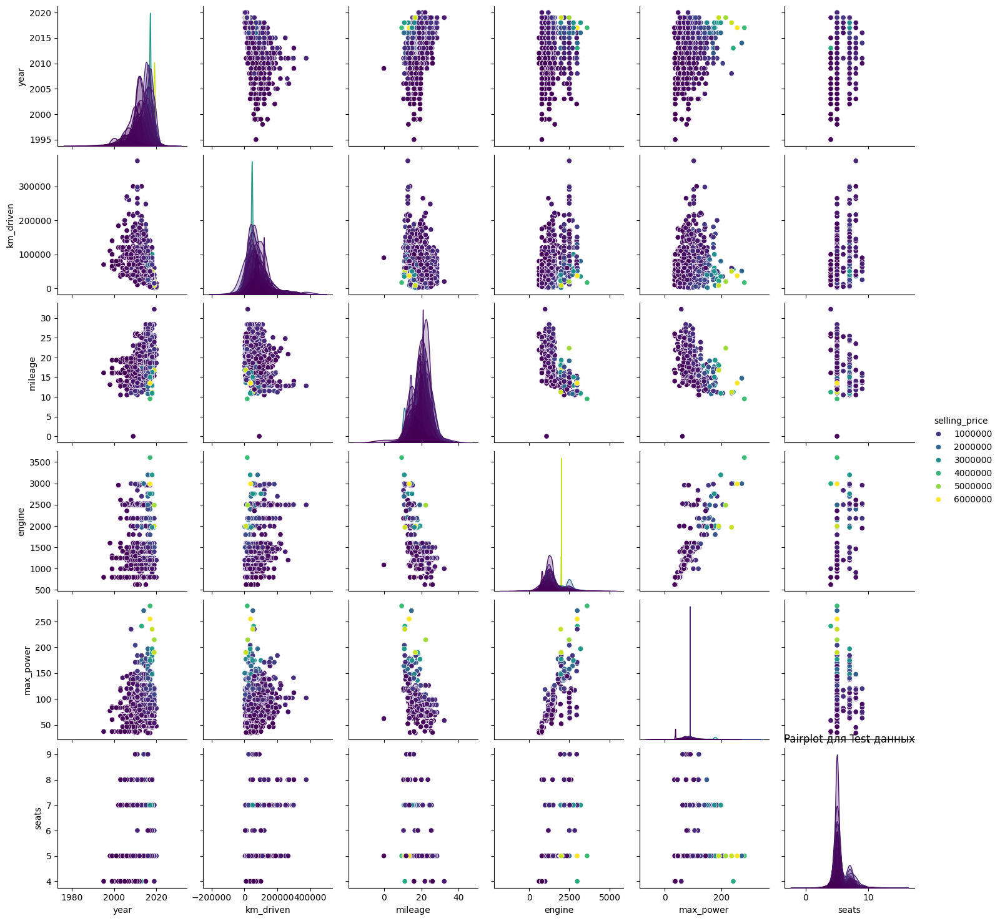

In [219]:
sns.pairplot(df_test, hue='selling_price', palette='viridis')
plt.title('Pairplot для Test данных')
plt.show()

`Your answer here` 1)Наблюдается связь между переменной selling_price и max_power
2)Видна зависимости между max_power и engine
3)Сововкупусноти оказались схожи при разделении

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


In [220]:
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,5


In [221]:
df_test_corr = df_test.drop(['name', 'fuel', 'seller_type', 'transmission', 'owner'], axis=1)

In [222]:
df_test_corr.corr().round(4)

,year,selling_price,km_driven,mileage,engine,max_power,seats
year,1.0000,0.4164,-0.4691,0.3416,0.0131,0.2281,0.0193
selling_price,0.4164,1.0000,-0.2358,-0.1502,0.4681,0.7507,0.0869
km_driven,-0.4691,-0.2358,1.0000,-0.2571,0.2894,0.0234,0.2868
mileage,0.3416,-0.1502,-0.2571,1.0000,-0.6017,-0.4047,-0.4741
engine,0.0131,0.4681,0.2894,-0.6017,1.0000,0.7268,0.6348
max_power,0.2281,0.7507,0.0234,-0.4047,0.7268,1.0000,0.2627
seats,0.0193,0.0869,0.2868,-0.4741,0.6348,0.2627,1.0000


<Axes: >

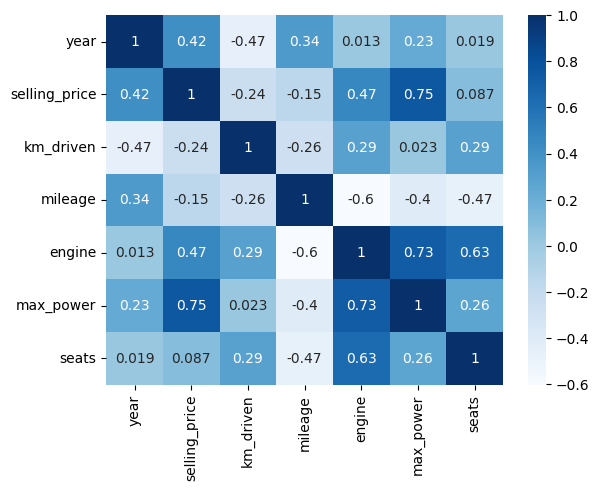

In [223]:
sns.heatmap(df_test_corr.corr(), cmap="Blues", annot=True)

In [224]:
df_train_corr = df_train.drop(['name', 'fuel', 'seller_type', 'transmission', 'owner'], axis=1)

In [225]:
df_train_corr.corr().round(4)

,year,selling_price,km_driven,mileage,engine,max_power,seats
year,1.0000,0.4273,-0.3690,0.3422,0.0028,0.1566,0.0412
selling_price,0.4273,1.0000,-0.1648,-0.1045,0.4477,0.6928,0.1500
km_driven,-0.3690,-0.1648,1.0000,-0.1822,0.2298,0.0246,0.1923
mileage,0.3422,-0.1045,-0.1822,1.0000,-0.5727,-0.3733,-0.4508
engine,0.0028,0.4477,0.2298,-0.5727,1.0000,0.6811,0.6522
max_power,0.1566,0.6928,0.0246,-0.3733,0.6811,1.0000,0.2441
seats,0.0412,0.1500,0.1923,-0.4508,0.6522,0.2441,1.0000


<Axes: >

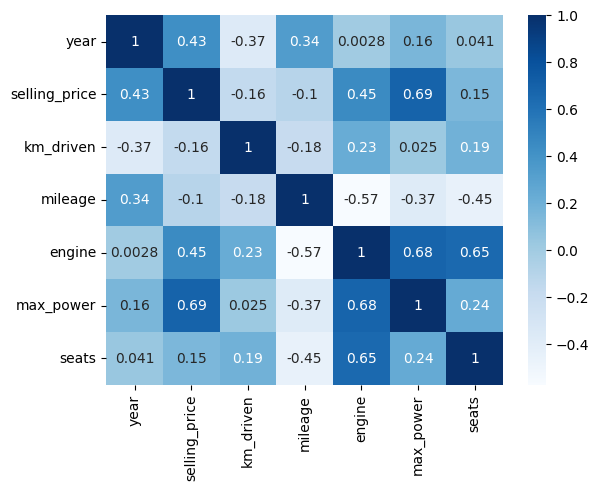

In [226]:
sns.heatmap(df_train_corr.corr(), cmap="Blues", annot=True)

In [227]:
# your code here


- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

`Your answer here`
1) Признаки max_power и year имеют самую слабую корреляцию.
2) Положительная линейная зависимость между max_power и selling_price, max_power и engine. max_power сильно колеррирует с selling_price
3) Видна обратная зависимость между year и km_driven. Понимаем, что с увеличением значения одного признака, другой - уменьшается. Поэтому чем старше машина, тем больше пробег

### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

In [228]:
# your code here
df_train_corr.corr(method = 'spearman').round(4)

,year,selling_price,km_driven,mileage,engine,max_power,seats
year,1.0000,0.7071,-0.5697,0.3466,-0.0381,0.1621,0.0483
selling_price,0.7071,1.0000,-0.2957,0.0268,0.4636,0.6098,0.3176
km_driven,-0.5697,-0.2957,1.0000,-0.1984,0.3045,0.0433,0.1953
mileage,0.3466,0.0268,-0.1984,1.0000,-0.4298,-0.3084,-0.4354
engine,-0.0381,0.4636,0.3045,-0.4298,1.0000,0.7141,0.5277
max_power,0.1621,0.6098,0.0433,-0.3084,0.7141,1.0000,0.3046
seats,0.0483,0.3176,0.1953,-0.4354,0.5277,0.3046,1.0000


<Axes: >

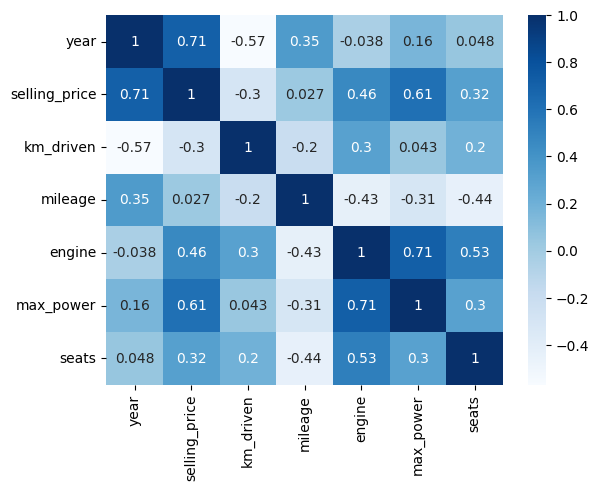

In [229]:
sns.heatmap(df_train_corr.corr(method = 'spearman').round(4), cmap="Blues", annot=True)

In [230]:
df_test_corr.corr(method = 'spearman').round(4)

,year,selling_price,km_driven,mileage,engine,max_power,seats
year,1.0000,0.7102,-0.5967,0.3159,0.0151,0.2096,0.0269
selling_price,0.7102,1.0000,-0.3277,-0.0201,0.5159,0.6652,0.2967
km_driven,-0.5967,-0.3277,1.0000,-0.2020,0.2609,0.0482,0.2365
mileage,0.3159,-0.0201,-0.2020,1.0000,-0.4629,-0.3479,-0.4455
engine,0.0151,0.5159,0.2609,-0.4629,1.0000,0.7722,0.5426
max_power,0.2096,0.6652,0.0482,-0.3479,0.7722,1.0000,0.3411
seats,0.0269,0.2967,0.2365,-0.4455,0.5426,0.3411,1.0000


<Axes: >

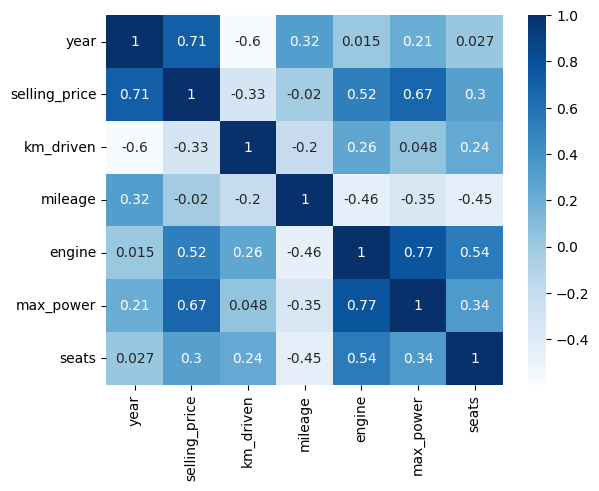

In [231]:
sns.heatmap(df_test_corr.corr(method = 'spearman').round(4), cmap="Blues", annot=True)

Корреляция спирмана нам тоже покакзаывает такую же яркую зависимости между нашими переменными как и корреляция пирсона

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [232]:
df_train_copy = df_train.drop(['name', 'fuel', 'seller_type', 'transmission', 'owner'], axis=1).copy()

In [233]:
df_train_copy.head()

,year,selling_price,km_driven,mileage,engine,max_power,seats
0,2014,450000,145500,23.40,1248,74.00,5
1,2014,370000,120000,21.14,1498,103.52,5
2,2010,225000,127000,23.00,1396,90.00,5
3,2007,130000,120000,16.10,1298,88.20,5
4,2017,440000,45000,20.14,1197,81.86,5


In [234]:
y_train = df_train_copy['selling_price'] # your code here
X_train = df_train_copy[['year', 'km_driven', 'mileage', 'engine', 'max_power', 'seats']] # your code here

In [235]:
assert X_train.shape == (5840, 6)

In [236]:
df_test_copy = df_test.drop(['name', 'fuel', 'seller_type', 'transmission', 'owner'], axis=1).copy()

In [237]:
df_test_copy.head()

,year,selling_price,km_driven,mileage,engine,max_power,seats
0,2010,229999,168000,14.0,2498,112.0,7
1,2017,665000,25000,21.5,1497,108.5,5
2,2007,175000,218463,12.9,1799,130.0,5
3,2015,635000,173000,25.1,1498,98.6,5
4,2011,130000,70000,16.5,1172,65.0,5


In [238]:
y_test = df_test_copy['selling_price']# your code here
X_test = df_test_copy[['year', 'km_driven', 'mileage', 'engine', 'max_power', 'seats']] # your code here

In [239]:
assert X_test.shape == (1000, 6)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [240]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

# your code here
model = LinearRegression()

model.fit(X_train, y_train)

pred_test = model.predict(X_test)
pred_train = model.predict(X_train)


print(f'''Metrics:
R2_train={r2_score(y_train, pred_train)}
MSE_train={MSE(y_train, pred_train)}
R2_test={r2_score(y_test, pred_test)}
MSE_test={MSE(y_test, pred_test)}
''')

Metrics:
R2_train=0.5922629595849875
MSE_train=116873067751.52162
R2_test=0.5941438519597548
MSE_test=233297703374.95682



MSE говорит нам о том, что модель переобучена, r2 говорит, что присуствует закономерность в данных.

### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [241]:
from sklearn.preprocessing import StandardScaler

# your code here
scaler = StandardScaler()

X_train_scaler = scaler.fit_transform(X_train)
X_test_scaler = scaler.transform(X_test)

model = LinearRegression()
model.fit(X_train_scaler, y_train)

train_pred_scaler = model.predict(X_train_scaler)
test_pred_scaler = model.predict(X_test_scaler)

print(f'''Metrics:
R2_train={r2_score(y_train, train_pred_scaler)}
MSE_train={MSE(y_train, train_pred_scaler)}
R2_test={r2_score(y_test, test_pred_scaler)}
MSE_test={MSE(y_test, test_pred_scaler)}
''')



Metrics:
R2_train=0.5922629595849875
MSE_train=116873067751.52162
R2_test=0.5941438519597675
MSE_test=233297703374.94952



### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [242]:
# your code here
name = np.argmax(np.abs(model.coef_))
index_name = X_train.columns
index_name[name]

'max_power'

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [243]:
from sklearn.linear_model import Lasso

# your code here
scaler = StandardScaler()

X_train_scaler = scaler.fit_transform(X_train)
X_test_scaler = scaler.transform(X_test)

model_lasso = Lasso()
model_lasso.fit(X_train_scaler, y_train)

test_pred_lasso = model_lasso.predict(X_test_scaler)
train_pred_lasso = model_lasso.predict(X_train_scaler)


print(f'''Metrics:
R2_train={r2_score(y_train, train_pred_lasso)}
MSE_train={MSE(y_train, train_pred_lasso)}
R2_test={r2_score(y_test, test_pred_lasso)}
MSE_test={MSE(y_test, test_pred_lasso)}
''')


print(model_lasso.coef_)


Metrics:
R2_train=0.5922629595497046
MSE_train=116873067761.63504
R2_test=0.5941426836091436
MSE_test=233298374976.25113

[152843.08385345 -44146.91853785  28779.20408499  61172.02578008
 322780.58619708 -23217.69327311]


In [244]:
# your code here
scaler = StandardScaler()

X_train_scaler = scaler.fit_transform(X_train)
X_test_scaler = scaler.transform(X_test)

model_lasso = Lasso(alpha = 50000)
model_lasso.fit(X_train_scaler, y_train)

test_pred_lasso = model_lasso.predict(X_test_scaler)
train_pred_lasso = model_lasso.predict(X_train_scaler)


print(f'''Metrics:
R2_train={r2_score(y_train, train_pred_lasso)}
MSE_train={MSE(y_train, train_pred_lasso)}
R2_test={r2_score(y_test, test_pred_lasso)}
MSE_test={MSE(y_test, test_pred_lasso)}
''')


print(model_lasso.coef_)

Metrics:
R2_train=0.5689918482675977
MSE_train=123543460431.27962
R2_test=0.5376941878351684
MSE_test=265746582269.96805

[131724.91419222     -0.              0.              0.
 300256.59562523      0.        ]


При первом обучениии с дефолтным alpha веса не занулились, это из-за того, что они очень огромные, при увелечении alpha удалось занули 4 веса.

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [245]:
from sklearn.model_selection import GridSearchCV

# your code here
params = {'alpha' : [0.01, 0.1, 0.5, 1, 10, 100, 1000, 10000, 25000, 50000,100000]}
gs = GridSearchCV(model_lasso, params, cv = 10)

gs.fit(X_train_scaler, y_train)

GridSearchCV(cv=10, estimator=Lasso(alpha=50000),
             param_grid={'alpha': [0.01, 0.1, 0.5, 1, 10, 100, 1000, 10000,
                                   25000, 50000, 100000]})

In [246]:
# your code here
-gs.best_score_, gs.best_estimator_, gs.best_params_,

(-0.5750070646667121, Lasso(alpha=25000), {'alpha': 25000})

In [247]:
model_gs = gs.best_estimator_

test_pred_gs = model_gs.predict(X_test_scaler)
train_pred_gs = model_gs.predict(X_train_scaler)

models_learn= len(gs.cv_results_['mean_test_score'])

print(f'''Metrics:
R2_train={r2_score(y_train, train_pred_gs)}
MSE_train={MSE(y_train, train_pred_gs)}
R2_test={r2_score(y_test, test_pred_gs)}
MSE_test={MSE(y_test, test_pred_gs)}
''')
print()
print(model_gs.coef_)
print()
print(models_learn)

Metrics:
R2_train=0.5832570453792939
MSE_train=119454508034.83531
R2_test=0.5662249847454113
MSE_test=249346265490.8394


[146826.17509687 -17036.09588044      0.              0.
 323310.60791        -0.        ]

11


при alpha = 50000 занулилсь 4 веса, также обучено было 11 моделей

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [248]:
from sklearn.linear_model import ElasticNet
# your code here
model_EN = ElasticNet()
params_EN =  {'alpha' : [25000, 50000, 100000], 'l1_ratio': [0.01, 0.1, 0.5, 0.9, 1]}

gs_EN = GridSearchCV(model_EN, params_EN, cv = 10)

gs_EN.fit(X_train_scaler, y_train)

GridSearchCV(cv=10, estimator=ElasticNet(),
             param_grid={'alpha': [25000, 50000, 100000],
                         'l1_ratio': [0.01, 0.1, 0.5, 0.9, 1]})

In [249]:
-gs_EN.best_score_, gs_EN.best_estimator_, gs_EN.best_params_,

(-0.5750070646667121,
 ElasticNet(alpha=25000, l1_ratio=1),
 {'alpha': 25000, 'l1_ratio': 1})

In [250]:
model_gs_EN = gs_EN.best_estimator_

test_pred_gs_EN = model_gs_EN.predict(X_test_scaler)
train_pred_gs_EN = model_gs_EN.predict(X_train_scaler)

models_learn_EN= len(gs_EN.cv_results_['mean_test_score'])

print(f'''Metrics:
R2_train={r2_score(y_train, train_pred_gs_EN)}
MSE_train={MSE(y_train, train_pred_gs_EN)}
R2_test={r2_score(y_test, test_pred_gs_EN)}
MSE_test={MSE(y_test, test_pred_gs_EN)}
''')
print()
print(models_learn_EN)

Metrics:
R2_train=0.5832570453792939
MSE_train=119454508034.83531
R2_test=0.5662249847454113
MSE_test=249346265490.8394


15


обучили 15 моделей, также лучший показатель alpha 25k

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


### **Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [251]:
# your code here
df_train['name'].head()

,name
0,Maruti Swift Dzire VDI
1,Skoda Rapid 1.5 TDI Ambition
2,Hyundai i20 Sportz Diesel
3,Maruti Swift VXI BSIII
4,Hyundai Xcent 1.2 VTVT E Plus


In [252]:
df_train['name'].value_counts().count()

1924

In [253]:
df_train['name'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 5840 entries, 0 to 5839
Series name: name
Non-Null Count  Dtype 
--------------  ----- 
5840 non-null   object
dtypes: object(1)
memory usage: 45.8+ KB


In [254]:
# создадим копию основновного датасета и дропним оттуда столбец name
df_train_copy2 = df_train.copy()
df_test_copy2 = df_test.copy()

df_train_copy2.drop(columns = 'name', inplace = True)
df_test_copy2.drop(columns = 'name', inplace = True)

In [255]:
df_train_copy2.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5
2,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5
3,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5
4,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,5


In [256]:
df_train_copy2.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,5
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,5
2,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,5
3,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,5
4,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,5


В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

### **Бонус 0.5 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [257]:
#assert X_train_cat.shape == (5840, 10)

In [258]:
#X_train_cat.describe(include='object')

### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [259]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

# your code here
cat = ['fuel','seller_type', 'owner', 'seats', 'transmission']
ohe = OneHotEncoder(drop = 'first')

data_ohe_train = ohe.fit_transform(df_train_copy2[cat])
df_ohe_train = pd.DataFrame(data_ohe_train.toarray(),columns=ohe.get_feature_names_out())
df_train_copy2 = df_train_copy2.join(df_ohe_train)
df_train_copy2.drop(cat, inplace=True, axis=1)

In [260]:
data_ohe_test = ohe.transform(df_test_copy2[cat])
df_ohe_test = pd.DataFrame(data_ohe_test.toarray(), columns=ohe.get_feature_names_out())
df_test_copy2 = df_test_copy2.join(df_ohe_test)
df_test_copy2.drop(cat, inplace=True, axis=1)

In [261]:
df_test_copy2.head(3)

,year,selling_price,km_driven,mileage,engine,max_power,fuel_Diesel,fuel_LPG,fuel_Petrol,seller_type_Individual,...,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14,transmission_Manual
0,2010,229999,168000,14.0,2498,112.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,2017,665000,25000,21.5,1497,108.5,1.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,2007,175000,218463,12.9,1799,130.0,0.0,0.0,1.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [262]:
df_train_copy2.head(3)

,year,selling_price,km_driven,mileage,engine,max_power,fuel_Diesel,fuel_LPG,fuel_Petrol,seller_type_Individual,...,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14,transmission_Manual
0,2014,450000,145500,23.40,1248,74.00,1.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,2014,370000,120000,21.14,1498,103.52,1.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,2010,225000,127000,23.00,1396,90.00,1.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [263]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

# your code here
y_train_copy2 = df_train_copy2['selling_price']
X_train_copy2 = df_train_copy2.drop(columns = 'selling_price', axis = 1)

y_test_copy2 = df_test_copy2['selling_price']
X_test_copy2 = df_test_copy2.drop(columns = 'selling_price', axis = 1)

model_ridge = Ridge()
params = {'alpha': [0.5, 1.0, 5.0, 7.5, 8.5]}
gs_ridge = GridSearchCV(model_ridge, params, cv =10, scoring = 'r2')

gs_ridge.fit(X_train_copy2, y_train)

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [0.5, 1.0, 5.0, 7.5, 8.5]}, scoring='r2')

In [264]:
-gs_ridge.best_score_, gs_ridge.best_estimator_, gs_ridge.best_params_,

(-0.6219676988309666, Ridge(alpha=7.5), {'alpha': 7.5})

In [265]:
model_gs_ridge = gs_ridge.best_estimator_

test_pred_gs_ridge = model_gs_ridge.predict(X_test_copy2)
train_pred_gs_ridge = model_gs_ridge.predict(X_train_copy2)

print(f'''Metrics:
R2_train={r2_score(y_train, train_pred_gs_ridge)}
MSE_train={MSE(y_train, train_pred_gs_ridge)}
R2_test={r2_score(y_test, test_pred_gs_ridge)}
MSE_test={MSE(y_test, test_pred_gs_ridge)}
''')

Metrics:
R2_train=0.6560639250523996
MSE_train=98585265024.3137
R2_test=0.6448879942189878
MSE_test=204128521372.97018



Удалось удучшить качетсво модели.

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [ ]:
def business_metric(y_true, y_pred):
  tolerance = 0.1
  within_tolerance = np.abs(y_true - y_pred) <= (tolerance * y_true)
  return np.mean(within_tolerance)


lr = business_metric(y_test, pred_test)
scaler = business_metric(y_test, test_pred_scaler)
lasso= business_metric(y_test, test_pred_lasso)
lasso_gs = business_metric(y_test, test_pred_gs)
en_gs = business_metric(y_test, test_pred_gs_EN)
ridge = business_metric(y_test, test_pred_gs_ridge)

print(f'LR: {lr}')
print()
print(f'Scaler: {scaler}')
print()
print(f'Lasso: {lasso}')
print()
print(f'Lasso gs: {lasso_gs}')
print()
print(f'en gs: {en_gs}')
print()
print(f'Ridge: {ridge}')

`Your answer here` Ridge:лучше всего справляется с поставленной задачей в нашей проделанной работе

In [ ]:
import pickle

filename = 'model_ridge.pkl'
with open(filename, 'wb') as file:
  pickle.dump(model_gs_ridge, file)

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 18 (3 балла)**


Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 19 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* сохраненный дашборд в любом формате
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией
3. Просматривает ноутбук с DS-частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой!

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/XbnpCTg)

</details>

